# Analyzing the behavior of a single spectral line using unsupervised learning

*by B. Panos*$^{1,2}$  

1 *University of Applied Sciences and Arts Northwestern Switzer- land, Bahnhofstrasse 6, 5210 Windisch, Switzerland*  
2 *University of Geneva, CUI-SIP, 1205 Geneva, Switzerland*

**----------------------------------------------------------------------------------------------------------------------------**

In this chapter we will explore how the spectral line associated with once ionized Magnesium (Mg II) behaves during a solar flare. To do this, we will make use of one of the most celebrated classical machine learning algorithms known as the k-means algorithm, to conjointly analyze slit-jaw images (SJI) and spectra collected by the Interface Region Imaging Spectrograph (IRIS).

This chapter draws heavily on the functionality provided by IRISreader, a library constructed for the purposes of supporting machine learning exploration on data collected by IRIS. For more information and a comprehensive documentation please visit https://github.com/chuwyler

<img src="files/into_fig.png" width="1000">

**Figure 1 -** Example of k-means applied to several different flares. The emergent spectra are color coded in accordance to which group (lower left panel) they are most similar to. 

In [63]:
# We will make use of he following libraries for this study:

import irisreader as ir
ir.config.verbosity_level=0
from irisreader.data.mg2k_centroids import get_mg2k_centroid_table, normalize
from irisreader import observation

from sklearn.datasets.samples_generator import make_blobs
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.cluster import MiniBatchKMeans

from matplotlib.ticker import MaxNLocator
import matplotlib.gridspec as gridspec
from IPython.display import Image
import matplotlib.pyplot as plt

from scipy.spatial import distance_matrix
import scipy.io
import scipy

import numpy as np
np.random.seed(0)

import warnings
warnings.filterwarnings("ignore")

from utils import *

## 1. Introduction

In this section, we discuss some basic physics and instrumentation surrounding the main data types generated by the IRIS satellite. We focus our study on a particularly informative spectral line, the resonant k-line of once ionized magnesium, and conclude with the posing of two simple but vital questions that we wish to address with the help of machine learning.

### What does our instrument see?

The majority of data for this chapter is from NASA's Interface Region Imaging Spectrograph (IRIS) small explorer spacecraft \cite{IRIS}, which is equipped with both a spectrograph and a slit-jaw imager (SJI). The spectrograph monitors several important ions emitting in the ultraviolet, while the imager provides simultaneous high resolution contextual images of the solar atmosphere in three different passbands spanning the NUV and FUV wavelengths. IRIS includes a variety of observational modes to serve the particular research requirements, however, this makes big data analysis a challenging endeavor, since the data is highly heterogeneous. An example of the two data types, images in different passbands and spectra, can be seen in the proceeding two plots:

In [2]:
# define the path to the IRIS data
# /data2/iris/2014/03/29/20140329_140938_3860258481
path = '~/HelioChapter/IRISData/'

# load a flare observation using IRISreader 
obs = observation( path + "20140329_140938_3860258481", keep_null=True )

# see what SJI channels the observation was recored in 
obs.sji.get_lines()

,field,wavelength,description
0,FUV2,1400.0,Si IV 1400
1,NUV,2796.0,Mg II h/k 2796
2,NUV,2832.0,Mg II wing 2832


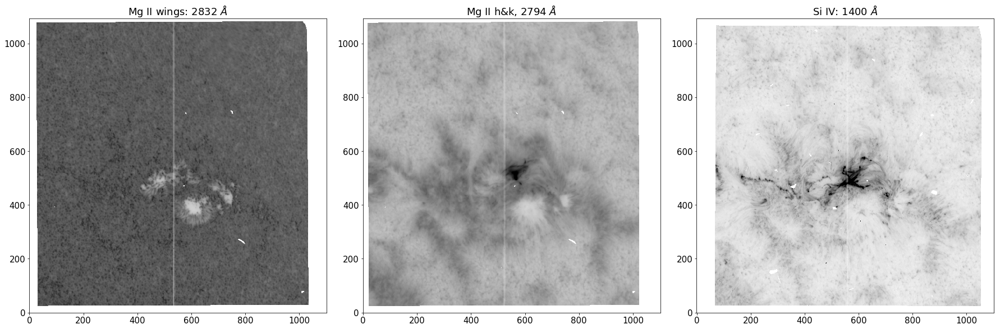

In [3]:
# Plot SJIs of the solar atmosphere in the three different passbands
plt.figure( figsize=(25,10) )
plt.rcParams.update({'font.size': 15})
gs = gridspec.GridSpec(1, 3)
ax1 = plt.subplot(gs[0,0:1])
ax2 = plt.subplot(gs[0,1:2])
ax3 = plt.subplot(gs[0:,2:3])
ax1.imshow( obs.sji("Mg II wing").get_image_step(49).clip(min=0)**0.3, origin="lower", cmap="Greys", vmax=10 )
ax1.title.set_text('Mg II wings: 2832 $\AA$')
ax2.imshow( obs.sji("Mg II h/k").get_image_step(496).clip(min=0)**0.3, origin="lower", cmap="Greys", vmax=10 )
ax2.title.set_text('Mg II h&k, 2794 $\AA$')
ax3.imshow( obs.sji("Si").get_image_step(496).clip(min=0)**0.3, origin="lower", cmap="Greys", vmax=10 )
ax3.title.set_text('Si IV: 1400 $\AA$')
plt.tight_layout()

**Figure 2 -** SJI's of the same observation in three different passbands.

We can observe different heights in the solar atmosphere by restricting the band of wavelengths our instrument collects. The abundance and opacity of each atomic transition maps out a noisy "surface of last scattering", where a large proportion of photons can escape the solar atmosphere to form an image on our instruments. For instance, at optical depth unity, $e^{-1}$ photons slip through the atmosphere without incurring any scattering events. Additionally, the steep and rich temperature structure of the solar atmosphere allows atoms to access transitions involving lower principal quantum number due to increased ionization levels at higher altitudes. The complex coupling between hight and wavelength is illustrated in the SJI's, with the $\sim$ 2832 $Å$ band scraping the upper photosphere, $\sim$ 2794 $Å$ band providing an excellent view of the chromosphere and the $\sim$ 1400 $Å$ band being sensitive to plasma of 65000 K, allowing views of the upper chromosphere and glimpses of the lower transition region.  

The white strip running down the center of each SJI marks the location of the spectrograph, which allows a small fraction of filtered light to pass onto a grating, where it is split into its finer constituent parts, giving rise to the second data type... spectra.

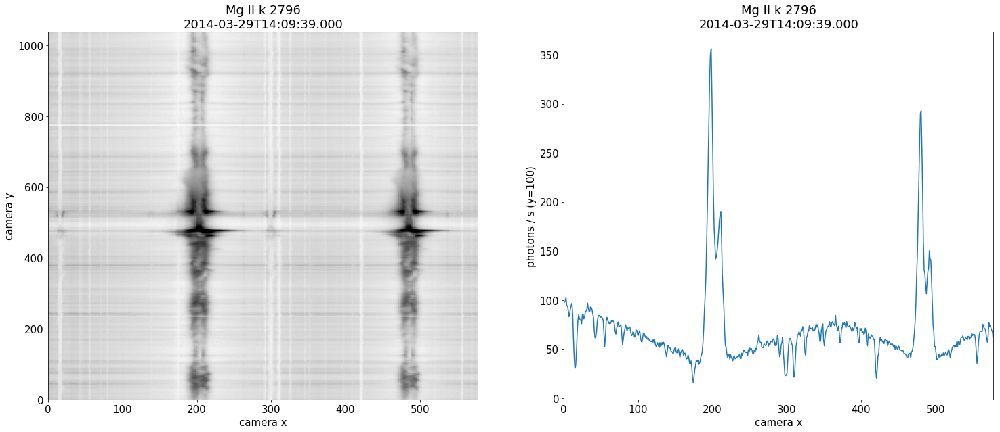

In [4]:
# Plot Mg II h&k spectra
obs.raster("Mg II k").crop()
plt.figure( figsize=(25,10) )
plt.rcParams.update({'font.size': 15})
gs = gridspec.GridSpec(1, 2)
ax1 = plt.subplot(gs[0,0:1])
obs.raster("Mg II k").plot(0, cmap='Greys')
ax2 = plt.subplot(gs[0,1:2])
obs.raster("Mg II k").plot( 0, y=100)
ax2.margins(x=0)

**Figure 3 -** Mg II spectra collected from the spectrograph. The right panel is a single slice at a fixed hight along the slit.

Spectral lines are the bread and butter of astronomy, and heliophysics is no exception. The shape of the spectra encodes a vast amount of physical information which can be leveraged by researchers to better understand remote environments such as the solar atmosphere. The above spectra is collected along the slit and shows the two resonant h&k lines of Mg II, which are amongst the strongest lines in the UV solar spectrum. The panel on the right displays a single profile sourced from a fixed y-value along the slit. It is important to realize that we do not have spectral information over the entire SJI. The h&k lines are symmetric apart from a factor of two in their oscillation strengths. Although there is a great deal of information to be gained from their relative positions and intensities \cite{Paper2}, as a first study we consider only the strongest of the two lines, the Mg II k-line.

### Why is the Mg II k-line an excellent source of information? 

The k-line has a formation hight that extends over the entire chromosphere as well as extensively damped wings which follow the temperature structure of the upper photosphere. The 2v and 2r peaks are formed in the mid-chromosphere, with line core photons at k3 originating from an altitude just below the transition region. The large opacities of the resonant line implies a small geometrical thermalization length, and hence high sensitivity to temperature, density and velocity gradients \cite{sensitivity}. Because of these attributes, studying this particular resonant line seems like a fruitful endeavor. 

Forward modeling has provided us with great diagnostic tools for the quiet sun \cite{Paper1}, however, these diagnostics cannot be blindly extrapolated to the vastly different flaring atmosphere. For instance, the clear central reversal at k3 due to the uncoupling of the Plank and source function in the tenuous upper chromosphere is often seen in emission for flares (e.g. \cite{Lucia}). 

<img src="files/Mg_def.png">

**Figure 4 -** An example of the common nomenclature associated with the features of the Mg II resonant h&k lines. We analyze the k-line on the left.

The questions that we would like to answer in this chapter are the following:
1. Are the Mg II k-line profiles generated during a solar flare different from those of the quiet sun?
2. And if so, do different flares generate the same types of profiles?

## 2. k-means

In this section, we discuss the mathematics behind the k-means algorithm. We then experiment with k-means on two very different artificial data sets to try and understand how to select the only free parameter in the algorithm, namely, the number of groups $k$. Finally, we apply the same methods to real life spectral data from an IRIS observation, and infer some properties based on what we have learned from the artificial data sets.

### The k-means algorithm

The k-means algorithm \cite{macqueen1967} is a form of vector quantization, where a data set of points/vectors is divided into a specified number of groups, where each group is represented by a prototype or centroid which is the group average. k-means in effect is a sophisticated multidimensional binning technique, where the space of observations is represented by a smaller set of prototypes. In other words, k-means gives us a tractable observation space by providing us with a coarse representation of the original unwieldily space.  

The algorithm works by initiating $k$ centroids into the data space. Each point is then assigned to the centroid they appear nearest to under the $L2$ norm. The k-means objective is to 1) find the assignments and 2) find the positions of the centroids that minimize the total within cluster distance or "inertia"
$$
\mathcal { L } = \sum _ { i = 1 } ^ { n } \sum _ { j = 1 } ^ { k } \delta _ { c _ { i } , j } \left\| x _ { i } - \mu _ { j } \right\| ^ { 2 },
$$
where $\mu_j$ is the $j\text{'th}$ group centroid, $x_i$ the $i\text{'th}$ observations and $\delta_{c_i,j}$ the kronecker delta defined as

$$
\delta _ { c_i , j } = \left\{ \begin{array} { l l } { 1 , } & { \text { if } x _ { i } \text { belongs to group } j } \\ { 0 , } & { \text { if } x _ { i } \text { does not belong to group } j } \end{array} \right.
$$

The k-means algorithm minimizes the objective function $\mathcal{L}$ by initiated the centroids in the locations of $k$ randomly selected data points, and then iterating over a two step procedure known as coordinate decent:
1.  The data is partitioned into groups based on which centroid they appear nearest to
$$
c _ { i } = \underset { 1 \leq j \leq k } { \arg \min } \left\| x _ { i } - \mu _ { j } \right\| ^ { 2 }.
$$
2. The centroids are updated as the mean position of each group
$$
\mu _ { j } = \frac { 1 } { n _ { j } } \sum _ { i = 1 } ^ { n } \delta _ { c _ { i } , j } x _ { i }.
$$

This two step iteration terminates when either the centroids stop updating their location, or the distance between the old and new centroid positions are all below some specified threshold. The clustering depends on the initial random placement of centroids, hence it is customary to repeat the process a number of times ad select the clustering with the lowest total inter cluster distances.  

k-means has a time complexity which is effectively linear \cite{kmeans_time}, making it big data scalable, however, it requires the manual selection of the number of groups $k$. A number of techniques have been proposed to automate the choice of $k$. We will explore one of the popular methods known as the elbow technique. We provide a fast mini-batch version of the k-means algorithm below, which will be used in this chapter. For the details of this version, we refer the reader to the source code https://scikit-learn.org/stable/modules/generated/sklearn.cluster.MiniBatchKMeans.html

In [5]:
# k-means algorithm
def mini_batch_k_means(X, n_clusters=10, batch_size=10, n_init=10, verbose=0):

    '''
    Retun centroids and labels of a data set using the k-means algorithm in minibatch style

    input   - X: data in the form [m_examples, lambda]
            - n_clusters: number of groups to find in the data
            - batch_size: number of data points used for a single update step of the centroids (these add together in a running stream)
            - n_init: number of convergences tested, the itteration with the lowest inertia is retained
            - verbose: output statistics
    output: - centroids: form [n_clusters, lambda], mean points of groups
            - labels: list of assignments indicating which centroid each data point belongs to 
            - inertia: measure of performance, sum of all intercluster distances
    '''

    mbk = MiniBatchKMeans(init='k-means++', n_clusters=n_clusters, batch_size=batch_size,
                          n_init=n_init, max_no_improvement=10, verbose=verbose)

    mbk.fit(X)

    centroids = mbk.cluster_centers_
    labels = mbk.labels_
    inertia = mbk.inertia_

    return centroids, labels, inertia, n_clusters

### Finding the optimal number of groups $k$

The central question for this algorithm is: how many groups should we partition our data into? For some data sets, there exists a natural number of groups which can be found by monitoring how the inertia behaves when successively increasing the group number. In the shoulder method, the optimal number of groups is given by the point where the inertia drastically decreases and then subsequently undergoes only a gradual improvement with each additional group. This behavior when plotted looks like a shoulder and is where the technique derives its name. Although such a technique is useful for some data sets, it fails for others. We will demonstrate this with two synthetic data sets and then apply the same technique on a real data set containing spectra and compare the results. 

In [6]:
# generate two sample data sets, X1 and X2
batch_size = 45
centers = [[1, 1], [-1, -1], [1, -1], [-1, 1], [0, 0]]
X1, labels_true = make_blobs(n_samples=3000, centers=centers, cluster_std=0.2)
X2, labels_true = make_blobs(n_samples=3000, centers=centers, cluster_std=10)

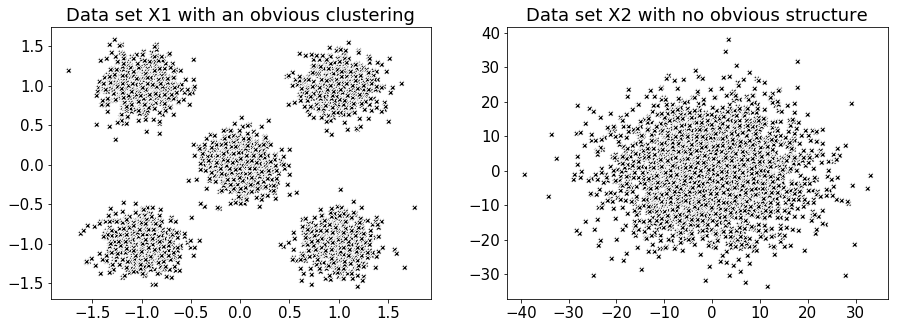

In [7]:
# plot both data sets
fig = plt.figure( figsize=(15,5) )
ax1=plt.subplot(121)
ax1.plot(X1[:, 0], X1[:, 1], 'w', markerfacecolor='k', marker='X')
plt.title('Data set X1 with an obvious clustering')
ax2=plt.subplot(122)
ax2.plot(X2[:, 0], X2[:, 1], 'w', markerfacecolor='k', marker='X')
plt.title('Data set X2 with no obvious structure')
plt.show()

**Figure 5 -** Two very different data sets for exploring a potential method for discerning the number of groups $k$ to use in the k-means algorithm.

In [8]:
# collect lists of both data sets inertia for successive increases in group number
X1_list_of_inertias = []
for n_groups in range(10):
    centroids, labels, inertia, n_clusters = mini_batch_k_means( X1, n_clusters=n_groups+1 )
    X1_list_of_inertias.append( inertia )
    
X2_list_of_inertias = []
for n_groups in range(10):
    centroids, labels, inertia, n_clusters = mini_batch_k_means( X2, n_clusters=n_groups+1 )
    X2_list_of_inertias.append( inertia )

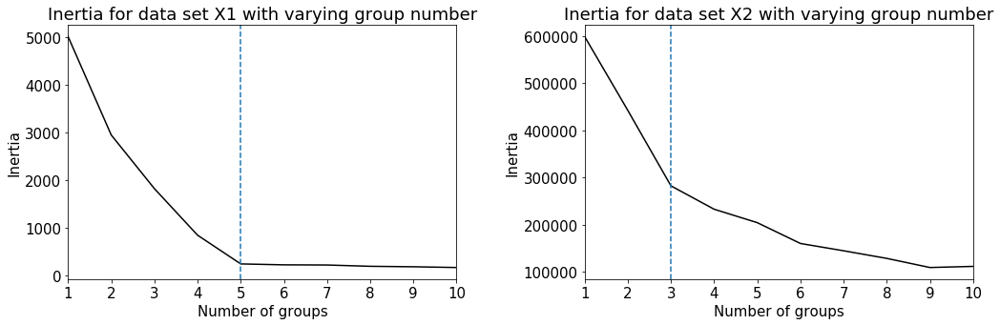

In [9]:
# plot inertia vs. group number for each data set
fig  = plt.figure( figsize=(15,5) )

ax1=plt.subplot(121)
ax1.plot( np.linspace(1,10,len(X1_list_of_inertias)), X1_list_of_inertias, color='k' )
ax1.xaxis.set_major_locator(plt.MaxNLocator(10))
ax1.axvline(x=5, linestyle='--')
ax1.margins(x=0)
plt.ylabel('Inertia', size=15)
plt.xlabel('Number of groups', size=15)
plt.title('Inertia for data set X1 with varying group number')

ax2=plt.subplot(122)
ax2.plot( np.linspace(1,10,len(X2_list_of_inertias)), X2_list_of_inertias, color='k' )
ax2.xaxis.set_major_locator(plt.MaxNLocator(10))
ax2.axvline(x=3, linestyle='--')
ax2.margins(x=0)
plt.ylabel('Inertia', size=15)
plt.xlabel('Number of groups', size=15)
plt.title('Inertia for data set X2 with varying group number')

plt.tight_layout()
plt.show()

A clear shoulder appears for data set X1, suggesting a natural choice for the number of groups as 5. On the other hand, data set X2 has a less distinguishable shoulder, and hence no clear group number. We will now plot the clustering results from the k-means algorithm with the plotting function below.

In [10]:
# plotting function to visualize the results of k-means
def plot_kmeans_results( X, labels, n_clusters, ax=None, **kwargs ): 
    ax = ax or plt.gca()
    colors = ['#FF9C34', 'black', 'gold', 'aquamarine', '#4EACC5', 
              '#FF9C34', '#4E9A06', 'pink', 'blue', 'grey', 'red']
    for k, clr in zip(range(n_clusters), colors):
        my_members = labels == k
        ax.plot(X[my_members, 0], X[my_members, 1], 'w', markerfacecolor=clr, marker='X')
    ax.set_title('K-means results') 
    plt.grid(True)
    return None

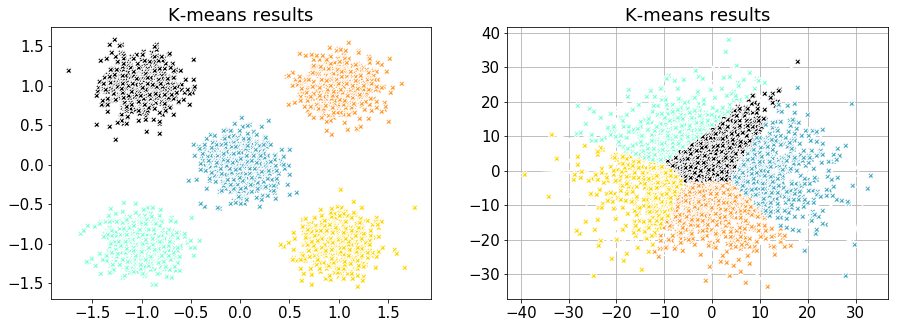

In [11]:
# use k-means with k = 5 for data set X1 and X2
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,5))
centroids, labels, inertia, n_clusters = mini_batch_k_means( X1, n_clusters=5 )
plot_kmeans_results(X1, labels, n_clusters, ax1)
centroids, labels, inertia, n_clusters = mini_batch_k_means( X2, n_clusters=5 )
plot_kmeans_results(X2, labels, n_clusters, ax2)

**Figure 6 -** k-means clustering results for data set X1 (left) and X2 (right).

### Applying k-means to an IRIS observation

Although there are two strong resonant Mg II lines in the spectral window, for simplicity we have chosen to focus on just the k-line. To this end, we have to specify a maximum and minimum wavelength in order to partition and extract only the strongest of the two lines. Additionally, we will provide the size of the wavelength grid to interpolate onto.  

In [12]:
lambda_min = 2793.85
lambda_max = 2799.32
n_bins = 216 # number of wavelength points to interpolate onto 
line_core = 2796.34 # location of the Mg II k-line core 
nprofxax = np.linspace( lambda_min, lambda_max, n_bins ) # new wavelength x-axis for plotting results 

For this real world application, we have to clean the data in several ways before we can apply the k-means algorithm and the shoulder technique.

1. IRIS uses different spectral resolutions based on the observation description and research requirements. This means that spectra form different observations have to be interpolated onto the same wavelength grid. It is important for machine leaning applications to have the same size feature space for each example. This procedure is automatically handled by the functionality provided in IRISreader.

2. The spectra has to be reshaped into the same form as data set X1 and X2.

3. Missing data in IRIS appears with a value of -200 and should be removed from the data set.

3. It is advisable to normalize each spectra by its maximum value, this has the consequence of reducing the parameter space and speeding up algorithms predicated on gradient descent, however, disregarding the intensity means that all applications after this step are only concerned with the shapes of the spectra.

To this end, we have provided a number of cleaning functions below. 

In [13]:
# functions to clean and place our spectral profiles into a 216 dimensional vector space 
def profile_rep( data ):
    '''
    put the data into the form [ m_examples, lambda ]
    '''
    return data.reshape( data.shape[0] * data.shape[1] * data.shape[2], data.shape[3] )

def clean(X, mode='del'):
    '''
    clean profiles which meet the following criterion:
        - Negative values -> condition = profile with any value <= -100
        - Overexposure -> condition = more than 3 points == max

    input  - X: matrix (example, feature)
           - modes:
               1) 'ones' -> replaces bad profiles with a vector of ones
               2) 'nans' -> replaces bad profiles with a vector of nan's
               3) 'del' -> deletes bad profiles (this changes dimentional structure, but usefull for unsupervised)
    '''
    # Clean profiles with negative
    small = np.min(X, axis = 1)
    # Clean overexposed profiles
    maxx = np.max(X, axis=1).reshape(len(X),1)
    diff = (X-maxx)
    w = np.where(diff == 0)
    dumb = np.zeros((X.shape[0], X.shape[1]))
    dumb[w[0], w[1]] = 1
    s =  np.sum(dumb, axis = 1)
    if mode == 'ones':
        X[np.logical_or(small <= -100, s >=3)] = np.full((1, X.shape[1]), fill_value = 1)
    if mode == 'nans':
        X[np.logical_or(small <= -100, s >=3)] = np.full((1, X.shape[1]), fill_value = np.nan)
    if mode == 'del':
        X = np.delete(X, np.concatenate((np.where(small<=-100)[0], np.where(s>=3)[0])), axis=0)
    return X

def normalize( X ):
    '''
    normalize each profile by its maximum
    '''
    maxx = np.max( X, axis=1 ).reshape(1, len( X ) ).T
    return X/maxx

In [14]:
# load observation with IRISreader
obs = observation( path + "20140910_112825_3860259453", keep_null=True)
data, raster, sji = extract_flare( obs, lambda_min, lambda_max, n_bins, verbosity_level=0 )

In [15]:
# reshape and clean the data with the above functions 
X = profile_rep( data )
X = clean( X, mode='del' )
X = normalize( X )

In [16]:
# collect a list of the data sets inertia for successive increases in group number
# If the calculation is taking to long you can reduce the batch_size, however, this will result in an erratic plot. 
# For the purposes of producing an inertia vs. group number plot, the mini-batch k-means has been set to run
# as normal k-means by selecting batch_size = len(X). The calculation should take around 4 min
list_of_inertias = []
for n_groups in range(10):
    centroids, labels, inertia, n_clusters = mini_batch_k_means(X, n_clusters=n_groups+1,
                                                                batch_size=len(X),
                                                                n_init=10,
                                                                verbose=0)
    list_of_inertias.append( inertia )

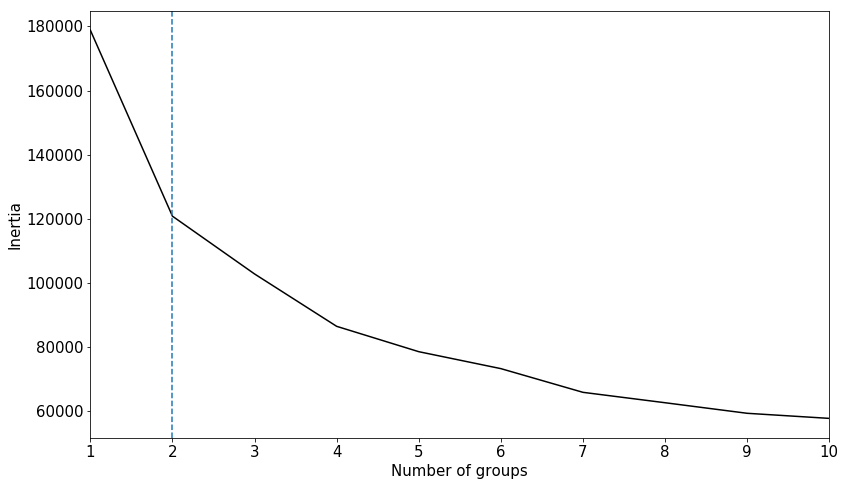

In [17]:
# plot inertia vs. group number for our spectral data set
fig, ax = plt.subplots( figsize=(12,7) )
plt.plot( np.linspace(1,10,len(list_of_inertias)), list_of_inertias, color='k' )
ax.xaxis.set_major_locator(plt.MaxNLocator(10))
plt.axvline(x=2, linestyle='--')
plt.margins(x=0)
plt.ylabel('Inertia', size=15)
plt.xlabel('Number of groups', size=15)
plt.tight_layout()
plt.show()

**Figure 7 -** Inertia v.s. number of groups for a real IRIS spectral data set. There is a clear sholder in the inertia at number of groups = 2, however, this simply devides quiet sun and flaring spectra as seen in Figure 8.

In [18]:
# seperate the data into two groups X_qs and X_fl
centroids, labels, inertia, n_clusters = mini_batch_k_means( X, n_clusters=2, n_init=20  )

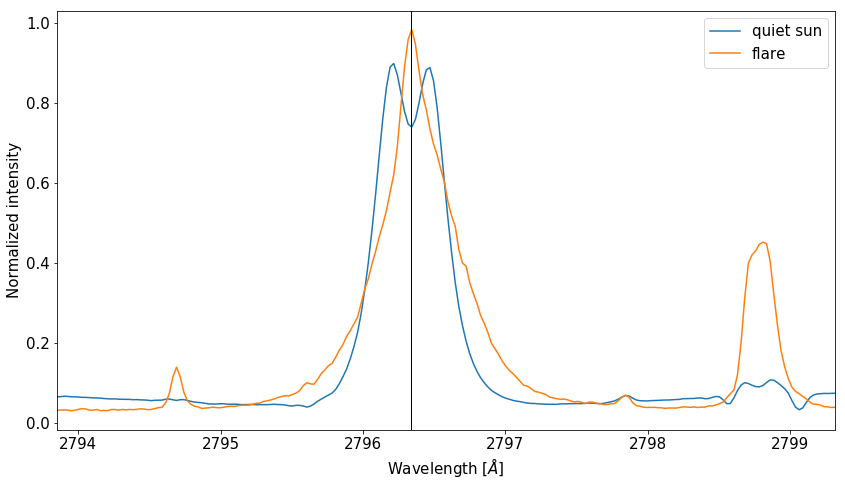

In [19]:
# plot the centroid of each group 
X_qs = centroids[0]
X_fl = centroids[1]

fig, ax = plt.subplots(figsize=(12,7))
ax.plot(nprofxax, X_qs, label='quiet sun')
ax.plot(nprofxax, X_fl, label='flare')
ax.axvline(x=line_core,color='black',linewidth = 1)
plt.xlabel('Wavelength [$\AA$]')
plt.ylabel('Normalized intensity')
ax.legend()
ax.margins(x=0)
plt.tight_layout()

**Figure 8 -** Centroids using the suggested parameter $k=2$ from the shoulder technique. This superfluous separates quiet sun and flaring type spectra.

Apart from this separation, setting the number of groups equal to 2 does not offer us enough "information resolution" to study the dynamics of the solar atmosphere. Additionally, the inertia vs. group number plot after $n=2$ improves excessively slowly with the addition of more groups, implying that our real life spectral data resembles a structureless data set similar to that of X2. It is often the case, and spectral analysis with IRIS is no exception, that the selection of the number of groups to use in k-means can not be automated, and should be left to the discretion of a professional in the field.  

## 3. Application of k-means to IRIS data  

It appears that we need to reach for an external source of data other that the raw spectra in order to decide how to fix $k$. In this section, we load three IRIS observations, one quiet sun, and two flaring observations, which we refer to as qs, f1 and f2 respectively. We apply the k-means algorithm to the qs observation and then create what we call a "centroid mask", indicating in a live SJI animation the group assignments of the emergent spectra. We then take the centroid mask generated for the qs observation and try to apply it to one of the flaring observations. The results indicate the incompatibility of the mask, meaning that the spectra from flaring atmospheres is markably different form those of the quiet sun. In the light of these observations, we create a new mask predicated on one of the flares, and see whether this mask is still compatible with the remaining flare observation. If it is, then we can start drawing conclusions about the possible similarity of chromospheric physics in flaring atmospheres.

### Our observations:  

We will load our three IRIS observations using the preprocess_obs and extract_flare functions of IRISreader provided in Utils.py. The functions return a plot of the GOES X-ray flux over the green period where the IRIS observations were extracted. In the case of the qs observation, the total integrated soft X-ray flux is below flaring level and stable, in comparison to the flaring observations which indicate regions of high X-ray flux. Animated movies of each observation obtained by interweaving consecutive SJIs together accompany the GOES plots. In addition to this, a link to the Heliophysics Events Knowledgebase (HEK) is provided if the reader requires a more detailed description of the observations. Finally, a small insert of the data, raster and sji shapes are provided.

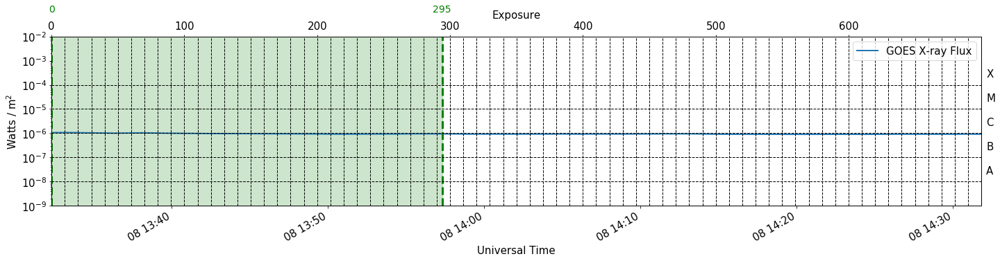

index interval for raster position 0: 0-294 (totalling 294 exposures, 24.9 minutes)


HEK URL:


Raster is 24.9 minutes long after cut (should be equal to 24.9 minutes estimated above)
data Shape: (1, 294, 773, 216), raster shape: (294, 773, 754), n_raster_pos: 1


In [20]:
obs_qs = observation( path + "20140208_133217_3803257203", keep_null=True)
data_qs, raster_qs, sji_qs = preprocess_obs( obs_qs, "QS", lambda_min, lambda_max, n_bins, verbosity_level=2 )

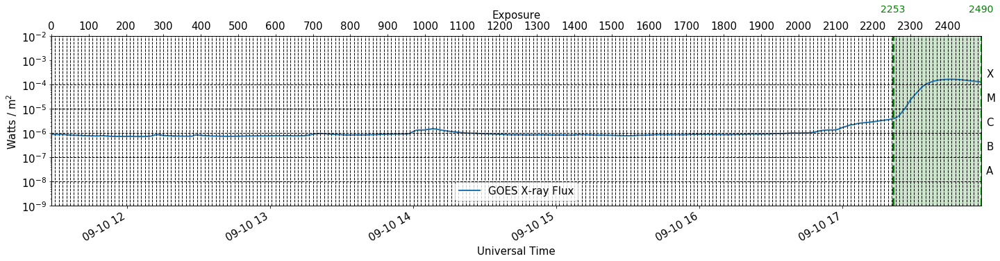

Cutting raster from indices 2253-2489 --> 36.9 minutes (of 59.0 minutes total flare duration)


HEK URL:


Raster is 36.9 minutes long after cut
data Shape: (1, 237, 776, 216), raster shape: (237, 776, 626), n_raster_pos: 1


In [21]:
obs_fl = observation( path + "20140910_112825_3860259453", keep_null=True)
data_f1, raster_f1, sji_f1 = extract_flare( obs_fl, lambda_min, lambda_max, n_bins, verbosity_level=2 )

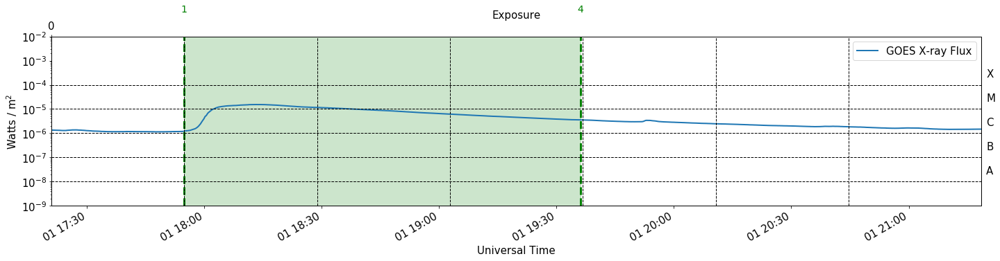

Cutting raster from indices 1-3 --> 101.3 minutes (of 53.0 minutes total flare duration)


HEK URL:


Raster is 101.3 minutes long after cut
data Shape: (64, 192, 776, 216), raster shape: (192, 776, 754), n_raster_pos: 64


In [22]:
obs_f2 = observation( path + "20140801_172059_3800013190", keep_null=True)
data_f2, raster_f2, sji_f2 = extract_flare( obs_f2, lambda_min, lambda_max, n_bins, verbosity_level=2 )

We notice here some of the heterogeneity of IRIS observations mentioned glancingly in the introduction. Observations could be set to sit-and-stare, like our first two observations where the slit remains in a fixed position, or alternatively the slit could perform rasters, where it sweeps out regions of space in an incremental, tunable number of steps like our last observation. Along with this, exposure times, roll angle and cadence all remain flexible parameters in IRIS's arsenal of settings. 

The above functions package the data into variables
1. data - which is a tensor of shape [number of slit positions, number of rasters, y pixel position, wavelength]
2. raster - which is an IRIS cube of shape [number of rasters, y pixel position, wavelength] and can be utilised with a number of methods.
3. sji - which is an IRIS cube of shape [number of images, y pixel coord, x pixel coord]   

### Finding quiet sun centroids and making centroid masks

Once we have cleaned our qs data, we can apply the k-means algorithm to find possible centroids. In order to make informed decision about the chosen centroids, we have provided a plotting function called centroid_summary below. In addition to this, we can see how well the centroids describe the data by observing animated movies with the "centroid masks" overplotted. To this end, a function has been developed called animate_mask, which can be found in utils.py.

In [23]:
def centroid_summary( centroids, clr_dic, rows=14, cols=4 ):
    '''
    plots a summary of the centroids found by the k-means run
    '''

    line_core = 2796.34
    nlam = 216
    in_text = 20
    nprofxax = np.linspace( lambda_min, lambda_max, n_bins )

    fig, axs = plt.subplots(rows, cols, figsize = (15, 15) )
    ax=axs.ravel()
    for k in range(len(centroids)):
        ax[k].plot(nprofxax, centroids[k], color='black', linewidth=2, linestyle='--')
        ax[k].plot(nprofxax, centroids[k], color=clr_dic.get(k,'black'), linewidth=2)
        ax[k].axvline(x=line_core,color='black',linewidth = 1)
        ax[k].text( .05, .85, str(k), transform=ax[k].transAxes, size=in_text)
    fig.text(0.5, 0.91, 'Mg II k centroids', ha='center', va='center', rotation='horizontal',size=30)
    fig.text(0.5, 0.05, 'Wavelength [$\AA$]', ha='center', va='center', rotation='horizontal',size=30)
    fig.text(0.05, 0.5, 'Normalized intensity', ha='center', va='center', rotation='vertical',size=30)
    plt.show()
    
    return None

In [24]:
# reshape and clean the data like before
X = profile_rep( data_qs )
X = clean( X, mode='del' )
X = normalize( X )

In [25]:
# apply the k-means algorithm to the qs observation with k = 4 groups.
n_groups = 4
centroids, labels, inertia, n_clusters = mini_batch_k_means(X, n_clusters=n_groups,
                                                            batch_size=1000,
                                                            n_init=10,
                                                            verbose=0)

To see the centroids k-means has found, we use the centroid_summary function 

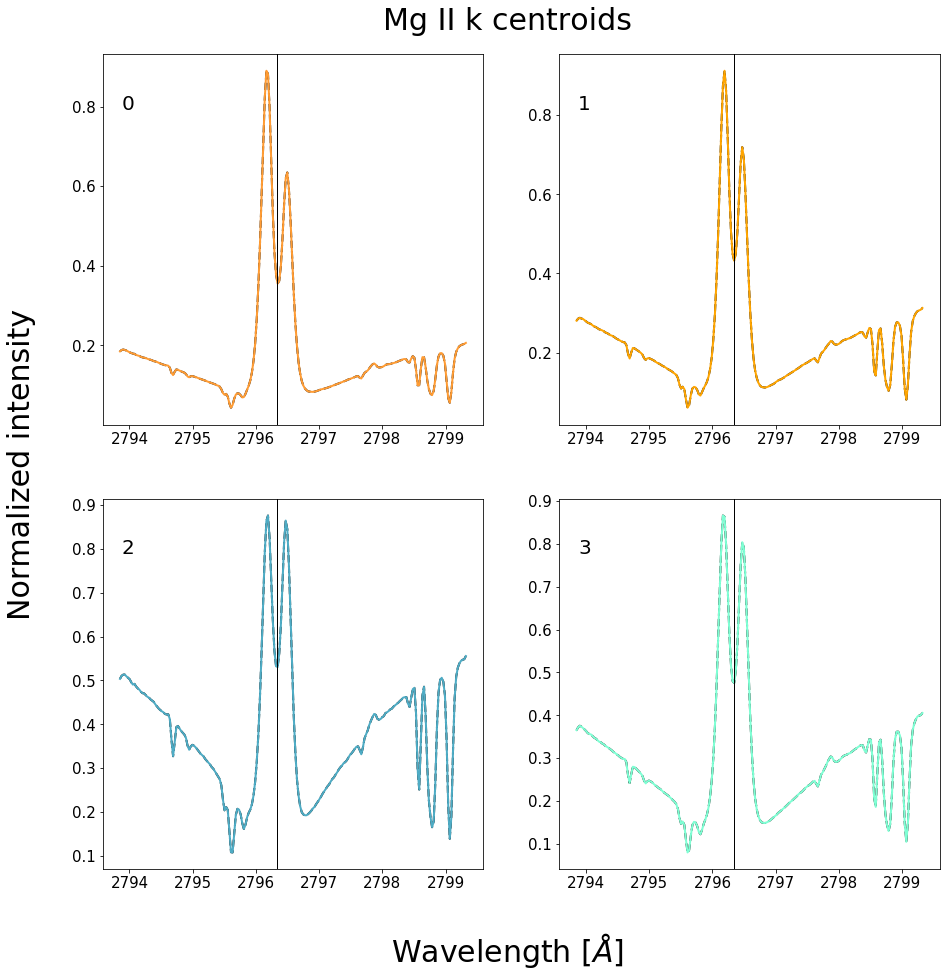

In [26]:
clr_dic = {0:'#FF9C34', 1:'orange', 2:'#4EACC5', 3:'aquamarine'}
centroid_summary( centroids, clr_dic, rows=2, cols=2 )

**Figure 9 -** Centroids found using the k-means algorithm with $k=4$ on a quiet sun data set.

In [30]:
# animate the SJI's with the centroid mask 
animate_mask(obs_qs, 'qs', centroids, clr_dic)

The color coding system indicates how the emergent spectra along the IRIS slit have been placed into groups according to which centroid they are most similar to. Notice how the assignments of spectra are consistently clumped together. If we assume that the solar atmosphere changes smoothly in the horizontal directions, then we would expect the above groupings or clumping of colors. If the emergent spectral profiles were entirely random, then we would expect a static type noisy mask. Additionally, the bubbling of the features in the SJIs are correlated with the changing of colors. This provides us with an alternative "metric" for finding our free parameter $k$.

### New objective:
 - The number of groups $k$ used in the k-means algorithm, should be chosen such that changes in the IRIS SJI are accompanied by changes in colors. i.e., the number of centroids must be large enough in order to provide the sensitivity necessary to capture bulk atmospheric changes viewed on the SJI, but small enough so that colors are still grouped together and each spectra is not uniquely defined. 

### Application of the centroids found in the quiet sun to a flaring observation.

The objective of this chapter is to find the possible shapes of profiles generated in the flaring sun. If the centroids describing our quiet sun observation above, provide a suitable mask which is sensitive to obvious changes on the flaring SJIs, then we can concluded that flares generate similar shaped profiles. Lets see...

In [31]:
# animate the SJI's with the qs centroid mask 
animate_mask(obs_fl, 'f1', centroids, clr_dic)

As expected, there is little to no consistency between the spectral assignment and the evolution of the SJI animation, since the colors do not adapt when the flare ribbon passes over the IRIS slit.

### Finding centroids related to the flaring sun and making new centroid masks

Let us now do the reverse and find centroids for the flaring sun.

In [55]:
# reshape and clean the data like before
X = profile_rep( data_f1 )
X = clean( X, mode='del' )
X = normalize( X )

In [56]:
# apply the k-means algorithm to the f1 observation with k = 3 groups.
n_groups = 3
centroids, labels, inertia, n_clusters = mini_batch_k_means(X, n_clusters=n_groups,
                                                            batch_size=1000,
                                                            n_init=20,
                                                            verbose=0)

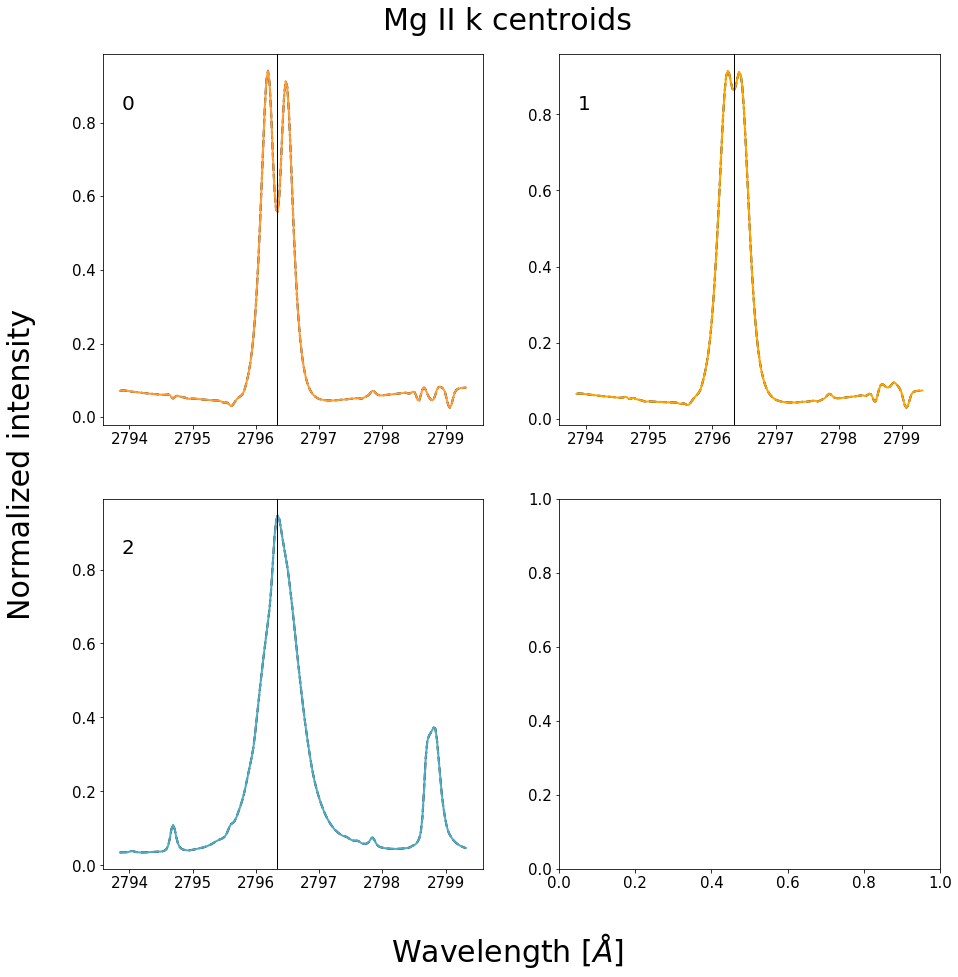

In [57]:
clr_dic = {0:'#FF9C34', 1:'orange', 2:'#4EACC5', 3:'aquamarine'}
centroid_summary( centroids, clr_dic, rows=2, cols=2 )

**Figure 10 -** Centroids found using the k-means algorithm with $k=3$ on a flaring data set.

In [58]:
# animate the SJI's with the centroid mask
animate_mask(obs_fl, 'f1', centroids, clr_dic)

With the new centroid masked sourced from a flare observation, the colors adapt with the evolving SJI animation, clearly showing vastly different spectra when the ribbon front passes over the slit in comparison with the ordinary quiet sun spectra encountered thus far. We can conclude from this that the emergent Mg II spectra from a flaring atmosphere is very different from that of the quiet sun.

### Is the centroid mask sourced from one flare consistent with a new never before seen flare?

We now apply the old mask found using the spectral data from observation f1 to observation f2.

In [59]:
# animate the SJI's of observation f2 with the centroid mask from f1
animate_mask(obs_f2, 'f2', centroids, clr_dic)

It appears that the centroid masks are transferable between flaring observations. In particulary, the regions where the ribon front initaly touch, turn the same color.

### Using a comprehensive centroid mask

The reader is encouraged to change the number of groups used in the k-means algorithm and experiment with different centroid masks. Selecting $k=3$ like we have in the above examples provides to coarse of a representation to model the most interesting aspects of the flaring atmosphere. To demonstrate what is possible with this method, we present results that use a comprehensive centroid mask from the study of \cite{Panos}. This mask is provided as the default mask in the IRISreader library.

In [61]:
# load centroids from the study "Identifying typical Mg II flare spectra using machine learning"
from irisreader.data import mg2k_centroids
centroids = mg2k_centroids.get_mg2k_centroids()
centroids.shape

(53, 216)

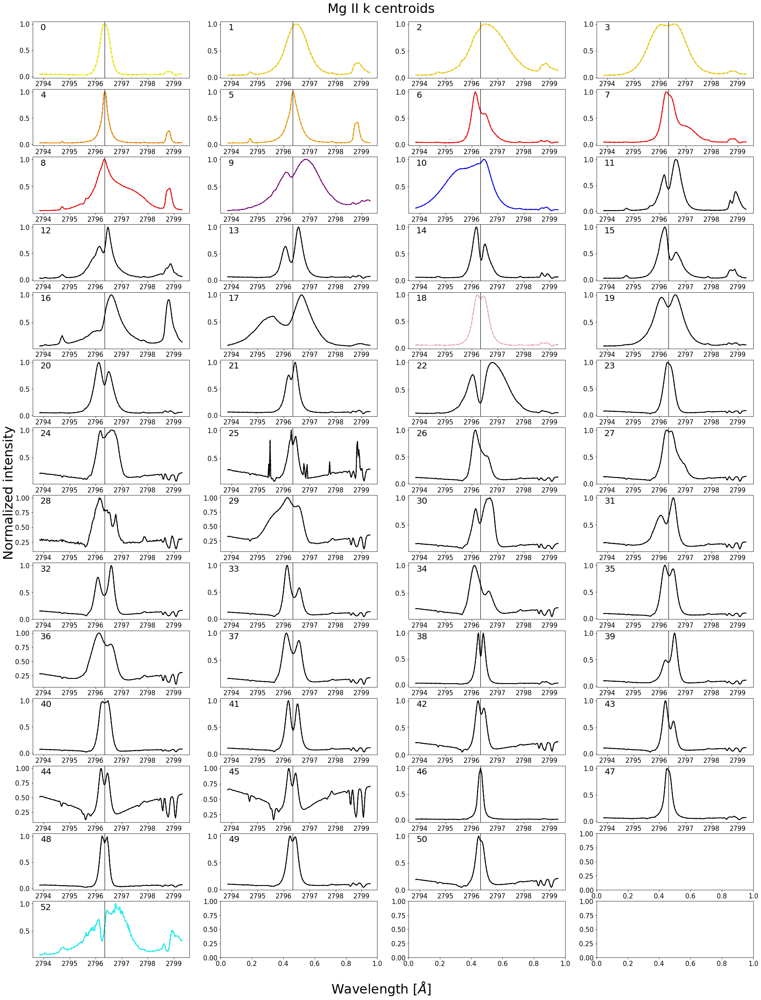

In [62]:
# plot centroids and create a color dictionary for the masked animations 
line_core = 2796.34
nlam = 216
rows = 14
cols = 4
in_text = 20
nprofxax = np.linspace( lambda_min, lambda_max, n_bins )

grps = [0,1,2,3,4,
        5,6,7,8,9,
        10,11,12,18,
        52]
clrs = ['yellow','gold','gold','gold','darkorange',
        'orange','red','red','red','purple',
        'blue','black','black','pink',
        'cyan']
clr_dic = dict(zip(grps, clrs))

fig, axs = plt.subplots(rows, cols, figsize = (30, 40) )
ax=axs.ravel()
for k in range(len(centroids)):
    if k == 51: continue # dont plot the bad profiles belonging to group 51
    ax[k].plot(nprofxax, centroids[k], color='black', linewidth=2, linestyle='--')
    ax[k].plot(nprofxax, centroids[k], color=clr_dic.get(k,'black'), linewidth=2)
    ax[k].axvline(x=line_core,color='black',linewidth = 1)
    ax[k].text( .05, .85, str(k), transform=ax[k].transAxes, size=in_text)
    
fig.text(0.5, 0.89, 'Mg II k centroids', ha='center', va='center', rotation='horizontal',size=30)
fig.text(0.5, 0.1, 'Wavelength [$\AA$]', ha='center', va='center', rotation='horizontal',size=30)
fig.text(0.1, 0.5, 'Normalized intensity', ha='center', va='center', rotation='vertical',size=30)
plt.show()

**Figure 11 -** Comprehensive centroid mask with colored centroids being clearly associated with flaring activity.

In [39]:
# animate the SJI's of observation q1 with this new mask 
animate_mask(obs_qs, 'qs', centroids, clr_dic)

As expected, the quiet sun observation is insensitive to this mask since it contains no flaring profiles. 

In [40]:
# animate the SJI's of observation f1
animate_mask(obs_fl, 'f1', centroids, clr_dic)

In [41]:
# animate the SJI's of observation f2
animate_mask(obs_f2,'f2', centroids, clr_dic)

This centroid mask provides us with a wealth of temporal information. Firstly, the front of the moving flare ribbon is always associated with the spectra from groups 11 and 12 (black). These profiles are extremely broad and have a blue shifted central reversal as well as large subordinate emission. Once the flare ribbon sweeps over the surface it leave profiles associated with group 4 and 5 (orange), which indicate increased densities and temperatures. Chromospheric downflows can be seen at the end of observation f1, as indicated by group 6, 7 and 8 (red). For a detailed analysis and description of these observations we refer the reader to \cite{Panos}.

## 4. Conclusion

Since the shape of the Mg II resonant spectral lines are fantastic indicators of physics in the solar chromosphere, we designed to find the different spectral shapes associated with the flaring atmosphere. To make the problem tractable we used a vector quantization technique known as k-means.  

By experimenting with artificial data sets, we discovered that the IRIS spectral data is not easily associated with a particular number of groups $k$, and that selecting the number of groups for the k-means algorithm should be informed by analyzing SJI animations with centroid mask overlays. In particular, one should aim at finding a $k$, such that changes in the SJI animation are associated with changes in color.  

We created a centroid mask from a quiet sun observation and discovered that the mask is not transferable to flaring observations, indicating that the spectra of a flare is very different form that produced in the quiet sun. 

We then created a new centroid mask more suited to flaring observations. It was found that not only does this mask capture some basic dynamics of the SJI animation, but it also consistently extends to new flaring observations that have not been seen before. This leads us to believe that although the spectra generated in a flare differs from that of the quiet sun, flares generate the same types of spectra amongst each other.  

Finally, we looked at how a comprehensive centroid mask captures the dynamics of a flare, finding common inter-flare patterns. This chapter should serve as an indication of the fruitfulness and applicability of machine learning clustering techniques within the heliophysics community.